In [1]:
import kagglehub

# Download latest version
path = kagglehub.dataset_download("splcher/animefacedataset")

print("Path to dataset files:", path)

Path to dataset files: /kaggle/input/datasets/splcher/animefacedataset


In [2]:
import kagglehub

# Download latest version
path = kagglehub.dataset_download("arnaud58/landscape-pictures")

print("Path to dataset files:", path)

Path to dataset files: /kaggle/input/datasets/arnaud58/landscape-pictures


In [3]:
import kagglehub

# Download latest version
path = kagglehub.dataset_download("ikarus777/best-artworks-of-all-time")

print("Path to dataset files:", path)

Path to dataset files: /kaggle/input/datasets/ikarus777/best-artworks-of-all-time


In [4]:
import kagglehub

# Download latest version
path = kagglehub.dataset_download("arnaud58/flickrfaceshq-dataset-ffhq")

print("Path to dataset files:", path)

Path to dataset files: /kaggle/input/datasets/arnaud58/flickrfaceshq-dataset-ffhq


In [5]:
import kagglehub

# Download latest version
path = kagglehub.dataset_download("sivarazadi/wikiart-art-movementsstyles")

print("Path to dataset files:", path)

Path to dataset files: /kaggle/input/datasets/sivarazadi/wikiart-art-movementsstyles


In [6]:
import kagglehub

# Download latest version
path = kagglehub.dataset_download("almightyj/person-face-sketches")

print("Path to dataset files:", path)

Path to dataset files: /kaggle/input/datasets/almightyj/person-face-sketches


In [2]:
#MAINLY MAIN
# ============================================================================
# MULTI-STYLE IMAGE GENERATION PIPELINE V4.0
# ============================================================================
#
#  মূল লক্ষ্য:
#  ✅ User Prompt + Style → LLM (Mistral-7B) → Refined Prompt
#  ✅ Multi-Dataset LoRA Fine-tuning (6 datasets, mixed training)
#  ✅ Stable Diffusion XL → Final Image (user-chosen style)
#  ✅ torchvision import নেই (conflict-free)
#  ✅ PIL দিয়ে সব image transforms
#  ✅ subprocess silent install
#  ✅ [NEW] Dual Mode Generation:
#       MODE 1 — Text → Image  : generate("prompt", style="anime")
#       MODE 2 — Image → Image : generate("prompt", style="anime",
#                                          image_path="/path/to/input.jpg",
#                                          strength=0.65)
#
#  Datasets:
#    1. Anime Face        → /kaggle/input/datasets/splcher/animefacedataset/images
#    2. Best Artworks     → /kaggle/input/datasets/ikarus777/best-artworks-of-all-time/images/images
#    3. FFHQ (Real Faces) → /kaggle/input/datasets/arnaud58/flickrfaceshq-dataset-ffhq
#    4. Landscapes        → /kaggle/input/datasets/arnaud58/landscape-pictures
#    5. WikiArt Styles    → /kaggle/input/datasets/sivarazadi/wikiart-art-movementsstyles
#    6. Face Sketches     → /kaggle/input/datasets/almightyj/person-face-sketches/train
#
#  Supported styles (user can pick):
#    anime, painting, portrait, landscape, wikiart, sketch
# ============================================================================

import subprocess
import sys

def install_packages():
    print("🔧 Installing required packages...")
    packages = [
        'huggingface_hub==0.23.4',
        'diffusers==0.27.2',
        'transformers==4.40.2',
        'accelerate==0.30.1',
        'peft==0.10.0',
        'bitsandbytes',
        'accelerate',
        'safetensors',
        'ftfy',
        'scipy',
        'tqdm',
        'controlnet_aux',
        'opencv-python',
        'insightface',
        'onnxruntime-gpu',
    ]
    for pkg in packages:
        subprocess.run(
            [sys.executable, '-m', 'pip', 'install', '-q', pkg],
            capture_output=True
        )
    print("✅ All packages installed!\n")

install_packages()

# ============================================================================
# IMPORTS
# ============================================================================
import re
import gc
import os
import time
import json
import random
import warnings
import multiprocessing as mp
warnings.filterwarnings('ignore')

import numpy as np
from pathlib import Path
from typing import List, Dict, Optional, Tuple
from tqdm.auto import tqdm

import torch
import torch.nn.functional as F
import torch.cuda.amp as amp
from torch.utils.data import Dataset, DataLoader
from PIL import Image, ImageOps

from transformers import (
    AutoTokenizer,
    AutoModelForCausalLM,
    BitsAndBytesConfig,
    CLIPTextModel,
    CLIPTokenizer,
)
from diffusers import (
    StableDiffusionXLPipeline,
    StableDiffusionXLImg2ImgPipeline,
    StableDiffusionXLControlNetPipeline,
    ControlNetModel,
    AutoencoderKL,
    UNet2DConditionModel,
    DDPMScheduler,
    DPMSolverMultistepScheduler,
)
from diffusers.utils import load_image
from diffusers.optimization import get_scheduler
from peft import LoraConfig, get_peft_model
from accelerate import Accelerator

print("✅ All imports successful!\n")


# ============================================================================
# CONFIGURATION
# ============================================================================
class Config:
    # ── Datasets ──────────────────────────────────────────────────────────
    DATASETS = {
        "anime": {
            "path":    "/kaggle/input/datasets/splcher/animefacedataset/images",
            "type":    "flat",          # সব images এক folder এ
            "max":     800,
            # ✅ prompt এ trigger word আগে আসে — model শিখবে trigger → style
            "prompt":  "animestyle, anime face, high quality, detailed, cel shading, vibrant colors",
            "trigger": "animestyle",
            "desc":    "🎌 Anime Face — cel-shaded anime characters",
        },
        "painting": {
            "path":    "/kaggle/input/datasets/ikarus777/best-artworks-of-all-time/images/images",
            "type":    "artist_subdir", # artist নামের subdir এ images
            "max":     800,
            "prompt":  "paintingstyle, classical painting, fine art, oil painting, masterwork",
            "trigger": "paintingstyle",
            "desc":    "🖼️  Best Artworks — classical/famous paintings",
        },
        "portrait": {
            "path":    "/kaggle/input/datasets/arnaud58/flickrfaceshq-dataset-ffhq",
            "type":    "flat",
            "max":     800,
            "prompt":  "portraitstyle, realistic portrait, human face, high quality photography, detailed",
            "trigger": "portraitstyle",
            "desc":    "📷 FFHQ — high-quality real human portraits",
        },
        "landscape": {
            "path":    "/kaggle/input/datasets/arnaud58/landscape-pictures",
            "type":    "flat",
            "max":     800,
            "prompt":  "landscapestyle, beautiful landscape, nature scenery, high quality, detailed environment",
            "trigger": "landscapestyle",
            "desc":    "🌄 Landscape — scenic nature photography",
        },
        "wikiart": {
            "path":    "/kaggle/input/datasets/sivarazadi/wikiart-art-movementsstyles",
            "type":    "wikiart_subdir", # style/style/images.jpg
            "max":     800,
            "prompt":  "wikiartStyle, fine art, art movement style, museum quality, expressive artwork",
            "trigger": "wikiartStyle",
            "desc":    "🎨 WikiArt — art movements (Baroque, Impressionism, etc.)",
        },
        "sketch": {
            # ✅ paired dataset: photos/ + sketches/ একসাথে
            # path টা train/ root দেওয়া হচ্ছে
            # type="sketch_paired" → আলাদা loader logic
            "path":    "/kaggle/input/datasets/almightyj/person-face-sketches/train",
            "type":    "sketch_paired",
            "max":     800,
            "prompt":  "sketchstyle, pencil sketch, face drawing, line art, detailed sketch portrait",
            "trigger": "sketchstyle",
            "desc":    "✏️  Face Sketches — pencil/charcoal portrait sketches",
        },
    }

    OUTPUT_DIR      = "/kaggle/working/anime_lora_output"
    FINAL_IMAGE_DIR = "/kaggle/working/generated_images"

    # LLM
    LLM_MODEL    = "mistralai/Mistral-7B-Instruct-v0.2"
    USE_4BIT_LLM = True

    # SDXL
    SDXL_MODEL_ID = "stabilityai/stable-diffusion-xl-base-1.0"
    VAE_MODEL_ID  = "madebyollin/sdxl-vae-fp16-fix"

    # LoRA Training
    IMAGE_SIZE      = 512
    BATCH_SIZE      = 1
    GRADIENT_ACCUM  = 4
    NUM_EPOCHS      = 3
    LEARNING_RATE   = 1e-4
    LR_WARMUP_STEPS = 100
    # Epoch শেষ হলে training নিজেই থামবে — কোনো hard cap নেই
    # 3 epochs × 4800 images = 14,400 raw steps
    SAVE_STEPS      = 4800   # প্রতি epoch শেষে একবার save

    LORA_RANK    = 16
    LORA_ALPHA   = 32
    LORA_DROPOUT = 0.1
    LORA_TARGET_MODULES = [
        "to_k", "to_q", "to_v", "to_out.0",
        "proj_in", "proj_out",
        "ff.net.0.proj", "ff.net.2",
    ]

    # ── ControlNet Models ──────────────────────────────────────────────
    # Canny: overall structure/outline preserve
    CONTROLNET_CANNY_ID = "diffusers/controlnet-canny-sdxl-1.0"
    # Depth: 3D face shape/depth preserve — face identity রাখার জন্য সবচেয়ে গুরুত্বপূর্ণ
    CONTROLNET_DEPTH_ID = "diffusers/controlnet-depth-sdxl-1.0-small"

    # ── IP-Adapter Face ID ──────────────────────────────────────────────
    # Face identity embed → output এ face exactly same থাকে
    IP_ADAPTER_ID       = "h94/IP-Adapter-FaceID"
    IP_ADAPTER_FILENAME = "ip-adapter-faceid_sdxl.bin"

    # Generation
    GEN_NUM_STEPS      = 30
    GEN_GUIDANCE_SCALE = 7.5
    GEN_IMAGE_WIDTH    = 1024
    GEN_IMAGE_HEIGHT   = 1024
    GEN_NUM_IMAGES     = 1

    # ControlNet conditioning scales
    # Canny: structure/pose (কম দিলে বেশি style freedom)
    CANNY_LOW            = 100
    CANNY_HIGH           = 200
    CONTROLNET_CANNY_SCALE = 0.4   # structure loosely follow
    CONTROLNET_DEPTH_SCALE = 0.6   # face depth strictly preserve
    # IP-Adapter face weight (1.0 = face exactly copy, 0.5 = loose similarity)
    IP_ADAPTER_SCALE     = 0.8

    MIXED_PRECISION = "fp16"
    SEED = 42

config = Config()
os.makedirs(config.OUTPUT_DIR, exist_ok=True)
os.makedirs(config.FINAL_IMAGE_DIR, exist_ok=True)

# ── Available styles ──────────────────────────────────────────────────────
AVAILABLE_STYLES = list(config.DATASETS.keys())

def show_styles():
    """Available styles দেখাও।"""
    print("\n" + "=" * 60)
    print("🎨 AVAILABLE STYLES — generate() এ style= দিয়ে বেছে নাও")
    print("=" * 60)
    for key, val in config.DATASETS.items():
        print(f"  '{key:10s}' → {val['desc']}")
    print("=" * 60)
    print("\n📌 MODE 1 — Text → Image (text prompt দিলে):")
    print("  generate('a girl with blue hair', style='anime')")
    print("  generate('forest at sunset', style='landscape')")
    print("  generate('woman face', style='sketch')")
    print("\n📌 MODE 2 — ControlNet Style Transfer (নিজের ছবি upload করলে):")
    print("  # face/pose structure ধরে রেখে style বদলায় — img2img এর চেয়ে অনেক ভালো")
    print("  generate('convert to anime character', style='anime',")
    print("           image_path='/kaggle/working/my_photo.jpg')")
    print("  generate('oil painting masterpiece', style='painting',")
    print("           image_path='/kaggle/working/my_photo.jpg', controlnet_scale=0.5)")
    print("  # controlnet_scale: 0.4=loose style / 0.6=balanced (default) / 0.9=strict structure")
    print()

print(f"📁 Output   : {config.OUTPUT_DIR}")
print(f"📁 Images   : {config.FINAL_IMAGE_DIR}")
print(f"🖥️  Device   : {'CUDA — ' + torch.cuda.get_device_name(0) if torch.cuda.is_available() else 'CPU ⚠️'}")
if torch.cuda.is_available():
    vram = torch.cuda.get_device_properties(0).total_memory / 1e9
    print(f"💾 VRAM     : {vram:.1f} GB")
show_styles()


# ============================================================================
# HELPER: PIL-based transforms (torchvision ছাড়া)
# ============================================================================
def pil_to_tensor(img: Image.Image) -> torch.Tensor:
    arr = np.array(img, dtype=np.float32) / 255.0
    arr = (arr - 0.5) / 0.5
    return torch.from_numpy(arr).permute(2, 0, 1)

def resize_and_crop(img: Image.Image, size: int) -> Image.Image:
    w, h   = img.size
    scale  = size / min(w, h)
    nw, nh = int(w * scale), int(h * scale)
    img    = img.resize((nw, nh), Image.LANCZOS)
    left   = (nw - size) // 2
    top    = (nh - size) // 2
    return img.crop((left, top, left + size, top + size))

def augment(img: Image.Image) -> Image.Image:
    if random.random() > 0.5:
        img = ImageOps.mirror(img)
    return img


# ============================================================================
# STAGE 1: LLM PROMPT REFINEMENT
# ============================================================================
class PromptRefiner:
    """
    Mistral-7B-Instruct দিয়ে user prompt → SD-optimized prompt।
    Style-aware: প্রতিটি style এর জন্য আলাদা system instruction।
    """

    STYLE_HINTS = {
        "anime":     "anime-style cel shading, vibrant colors, large expressive eyes, beautiful face",
        "painting":  "oil painting style, classical art, fine brushwork, museum quality",
        "portrait":  "realistic portrait photography, high detail, professional lighting",
        "landscape": "scenic landscape photography, nature, atmospheric depth, beautiful lighting",
        "wikiart":   "fine art in a specific art movement style, expressive, museum quality",
        "sketch":    "pencil sketch, charcoal drawing, line art, hand-drawn portrait",
    }

    BASE_SYSTEM = (
        "You are an expert at writing Stable Diffusion prompts. "
        "Transform the user's simple description into a detailed, high-quality SD prompt. "
        "Always include: masterpiece, best quality, highly detailed. "
        "Keep it under 150 words. Return ONLY the refined prompt, nothing else."
    )

    def __init__(self):
        print("=" * 70)
        print("🤖 STAGE 1: LOADING LLM FOR PROMPT REFINEMENT")
        print("=" * 70)
        print(f"   Model : {config.LLM_MODEL}")
        print(f"   Quant : 4-bit NF4\n")

        torch.cuda.empty_cache()
        gc.collect()

        bnb_cfg = BitsAndBytesConfig(
            load_in_4bit=True,
            bnb_4bit_quant_type="nf4",
            bnb_4bit_compute_dtype=torch.float16,
        )
        self.tokenizer = AutoTokenizer.from_pretrained(
            config.LLM_MODEL, trust_remote_code=True
        )
        self.tokenizer.pad_token = self.tokenizer.eos_token

        self.model = AutoModelForCausalLM.from_pretrained(
            config.LLM_MODEL,
            quantization_config=bnb_cfg,
            device_map="auto",
            torch_dtype=torch.float16,
            trust_remote_code=True,
        )
        self.model.eval()
        print("✅ LLM ready!\n")

    def refine(self, user_prompt: str, style: str = "anime") -> str:
        style_hint = self.STYLE_HINTS.get(style, self.STYLE_HINTS["anime"])
        system = (
            f"{self.BASE_SYSTEM}\n\n"
            f"Style context: {style_hint}\n\n"
            f"Example:\n"
            f"Input: 'a girl with blue hair'\n"
            f"Output: 'masterpiece, best quality, highly detailed, {style_hint}, "
            f"a girl with long flowing blue hair, expressive eyes, bokeh background'"
        )

        print(f"🔄 Refining [{style}]: '{user_prompt}'")

        messages = [{"role": "user",
                     "content": f"{system}\n\nUser input: {user_prompt}"}]
        formatted = self.tokenizer.apply_chat_template(
            messages, tokenize=False, add_generation_prompt=True
        )

        inputs = self.tokenizer(
            formatted, return_tensors="pt",
            truncation=True, max_length=512
        ).to(self.model.device)

        with torch.no_grad():
            out = self.model.generate(
                **inputs,
                max_new_tokens=200,
                temperature=0.7,
                do_sample=True,
                top_p=0.9,
                repetition_penalty=1.1,
                pad_token_id=self.tokenizer.eos_token_id,
            )

        new_tokens = out[0][inputs["input_ids"].shape[1]:]
        refined    = self.tokenizer.decode(new_tokens, skip_special_tokens=True).strip()
        print(f"✅ Refined : '{refined}'\n")
        return refined

    def unload(self):
        del self.model, self.tokenizer
        gc.collect()
        torch.cuda.empty_cache()
        print("🗑️  LLM freed from VRAM\n")


# ============================================================================
# STAGE 2A: MULTI-DATASET LOADER
# ============================================================================
class MultiDatasetLoader:
    """
    সব 6টি dataset থেকে images load করো।
    প্রতিটি dataset এর জন্য আলাদা loader logic (type অনুযায়ী)।
    Return: List of (image_path, prompt_text, style_name) tuples।
    """

    SUPPORTED_EXTS = {".jpg", ".jpeg", ".png", ".webp", ".bmp"}

    def _collect_flat(self, base: Path) -> List[Path]:
        """Flat folder: সব images সরাসরি base folder এ।"""
        paths = []
        for ext in self.SUPPORTED_EXTS:
            paths += list(base.glob(f"*{ext}"))
            paths += list(base.glob(f"*{ext.upper()}"))
        return paths

    def _collect_artist_subdir(self, base: Path) -> List[Path]:
        """Artist subdirs: base/ArtistName/*.jpg"""
        paths = []
        for artist_dir in base.iterdir():
            if artist_dir.is_dir():
                for ext in self.SUPPORTED_EXTS:
                    paths += list(artist_dir.glob(f"*{ext}"))
                    paths += list(artist_dir.glob(f"*{ext.upper()}"))
        return paths

    def _collect_wikiart_subdir(self, base: Path) -> List[Path]:
        """WikiArt: base/Style/Style/*.jpg (2-level subdir)"""
        paths = []
        for style_dir in base.iterdir():
            if style_dir.is_dir():
                # কখনো base/Style/*.jpg, কখনো base/Style/Style/*.jpg
                inner = style_dir / style_dir.name
                target = inner if inner.is_dir() else style_dir
                for ext in self.SUPPORTED_EXTS:
                    paths += list(target.glob(f"*{ext}"))
                    paths += list(target.glob(f"*{ext.upper()}"))
        return paths

    def _collect_sketch_paired(self, base: Path) -> List[Path]:
        """
        Sketch paired dataset:
          base/photos/0.jpg   → real face
          base/sketches/0.jpg → সেই face এর sketch

        Strategy:
          sketches/ folder এর images load করো।
          কারণ:
            - LoRA training এ OUTPUT (sketch) image দিয়েই train হয়
            - prompt "sketchstyle, pencil sketch..." দেওয়া আছে
            - model শিখবে: এই prompt দিলে এরকম sketch output দিতে হবে
            - photos/ folder টাও load করো separate entry হিসেবে
              কিন্তু prompt এ "sketchstyle" থাকবে — model শিখবে
              photo input → sketch output mapping

        উভয় (photo + sketch) load করলে model দুটো দিক থেকে শেখে:
          1. sketch image দেখে: "এটাই আমার target output"
          2. photo image দেখে: "এই structure থেকে sketch বানাতে হবে"
        """
        photos_dir  = base / "photos"
        sketches_dir = base / "sketches"

        paths = []

        # sketches/ থেকে load — primary training target
        if sketches_dir.exists():
            for ext in self.SUPPORTED_EXTS:
                paths += list(sketches_dir.glob(f"*{ext}"))
                paths += list(sketches_dir.glob(f"*{ext.upper()}"))

        # photos/ থেকেও load — model শিখবে real face → sketch mapping
        # same filenames: 0.jpg photos তে আছে, 0.jpg sketches তেও আছে
        # paired হওয়ায় model context বোঝে
        if photos_dir.exists():
            for ext in self.SUPPORTED_EXTS:
                paths += list(photos_dir.glob(f"*{ext}"))
                paths += list(photos_dir.glob(f"*{ext.upper()}"))

        return paths

    def load_all(self) -> List[Tuple[Path, str, str]]:
        """
        Return: [(image_path, instance_prompt, style_name), ...]
        সব dataset মিলিয়ে একটি mixed list।
        """
        print("=" * 70)
        print("📊 STAGE 2A: LOADING ALL DATASETS")
        print("=" * 70)

        all_items: List[Tuple[Path, str, str]] = []

        for style_name, ds_cfg in config.DATASETS.items():
            base = Path(ds_cfg["path"])
            if not base.exists():
                print(f"   ⚠️  [{style_name}] Path not found, skipping: {base}")
                continue

            ds_type = ds_cfg["type"]
            if ds_type == "flat":
                raw = self._collect_flat(base)
            elif ds_type == "artist_subdir":
                raw = self._collect_artist_subdir(base)
            elif ds_type == "wikiart_subdir":
                raw = self._collect_wikiart_subdir(base)
            elif ds_type == "sketch_paired":
                # photos/ + sketches/ উভয় folder থেকে load
                raw = self._collect_sketch_paired(base)
            else:
                raw = self._collect_flat(base)

            # Dedup
            before = len(raw)
            raw    = sorted(set(raw))
            after  = len(raw)

            # Max images cap
            max_img = ds_cfg["max"]
            if len(raw) > max_img:
                raw = random.sample(raw, max_img)

            prompt = ds_cfg["prompt"]
            items  = [(p, prompt, style_name) for p in raw]
            all_items.extend(items)

            print(f"   ✅ [{style_name:10s}] raw={before:,}  dedup={after:,}  sampled={len(raw):,}")

        # Shuffle mixed dataset
        random.shuffle(all_items)

        print(f"\n   🔀 Total mixed training samples : {len(all_items):,}")
        print("=" * 70 + "\n")
        return all_items

    def load_style(self, style_name: str) -> List[Tuple[Path, str, str]]:
        """শুধু একটি নির্দিষ্ট style এর data load করো (inference এর জন্য নয়, debug এর জন্য)।"""
        all_items = self.load_all()
        return [(p, pr, s) for p, pr, s in all_items if s == style_name]


# ============================================================================
# STAGE 2B: DATASET CLASS
# ============================================================================
class MultiStyleDataset(Dataset):
    """
    Mixed dataset: প্রতিটি sample এর নিজস্ব prompt আছে (style অনুযায়ী)।
    """

    def __init__(self,
                 items: List[Tuple[Path, str, str]],
                 tokenizer_1,
                 tokenizer_2,
                 image_size: int = 512):
        self.items       = items
        self.tokenizer_1 = tokenizer_1
        self.tokenizer_2 = tokenizer_2
        self.image_size  = image_size

    def _tokenize(self, prompt: str, tokenizer) -> torch.Tensor:
        return tokenizer(
            prompt, truncation=True,
            max_length=tokenizer.model_max_length,
            padding="max_length", return_tensors="pt"
        ).input_ids.squeeze(0)

    def __len__(self):
        return len(self.items)

    def __getitem__(self, idx: int) -> Dict:
        img_path, prompt, style = self.items[idx]

        try:
            img = Image.open(img_path).convert("RGB")
        except Exception:
            return self.__getitem__(random.randint(0, len(self) - 1))

        # ── Sketch paired dataset special handling ─────────────────────────
        # photos/ থেকে আসা images এর জন্য prompt এ "photo reference" যোগ করো
        # sketches/ থেকে আসা images এর জন্য full sketch prompt রাখো
        # এতে model শেখে:
        #   photo → "sketchstyle ... photo reference face" — input হিসেবে চেনে
        #   sketch → "sketchstyle, pencil sketch ..." — output target হিসেবে চেনে
        if style == "sketch" and "/photos/" in str(img_path):
            prompt = "sketchstyle, realistic face photo, reference image for sketch conversion, detailed face"

        img    = resize_and_crop(img, self.image_size)
        img    = augment(img)
        pixels = pil_to_tensor(img)

        return {
            "pixel_values": pixels,
            "input_ids_1":  self._tokenize(prompt, self.tokenizer_1),
            "input_ids_2":  self._tokenize(prompt, self.tokenizer_2),
            "style":        style,
        }


# ============================================================================
# STAGE 2C: LoRA TRAINER
# ============================================================================
class LoRATrainer:
    """
    SDXL UNet এ LoRA fine-tuning।
    Mixed multi-dataset training।
    """

    def __init__(self):
        self.dev   = torch.device("cuda" if torch.cuda.is_available() else "cpu")
        self.accel = Accelerator(
            mixed_precision=config.MIXED_PRECISION,
            gradient_accumulation_steps=config.GRADIENT_ACCUM,
        )

    def _load_sdxl(self):
        print("=" * 70)
        print("📥 STAGE 2C: LOADING SDXL FOR LoRA TRAINING")
        print("=" * 70)

        self.vae = AutoencoderKL.from_pretrained(
            config.VAE_MODEL_ID, torch_dtype=torch.float16
        )
        self.vae.requires_grad_(False)

        self.tok1 = CLIPTokenizer.from_pretrained(
            config.SDXL_MODEL_ID, subfolder="tokenizer"
        )
        self.tok2 = CLIPTokenizer.from_pretrained(
            config.SDXL_MODEL_ID, subfolder="tokenizer_2"
        )

        self.enc1 = CLIPTextModel.from_pretrained(
            config.SDXL_MODEL_ID, subfolder="text_encoder",
            torch_dtype=torch.float16
        )
        self.enc1.requires_grad_(False)

        self.enc2 = CLIPTextModel.from_pretrained(
            config.SDXL_MODEL_ID, subfolder="text_encoder_2",
            torch_dtype=torch.float16
        )
        self.enc2.requires_grad_(False)

        self.unet = UNet2DConditionModel.from_pretrained(
            config.SDXL_MODEL_ID, subfolder="unet",
            torch_dtype=torch.float16
        )

        self.noise_scheduler = DDPMScheduler.from_pretrained(
            config.SDXL_MODEL_ID, subfolder="scheduler"
        )
        print("✅ SDXL components loaded!\n")

    def _apply_lora(self):
        print(f"🔧 Applying LoRA (rank={config.LORA_RANK}, alpha={config.LORA_ALPHA})...")
        lora_cfg = LoraConfig(
            r=config.LORA_RANK,
            lora_alpha=config.LORA_ALPHA,
            init_lora_weights="gaussian",
            target_modules=config.LORA_TARGET_MODULES,
            lora_dropout=config.LORA_DROPOUT,
        )
        self.unet = get_peft_model(self.unet, lora_cfg)

        # LoRA trainable params → FP32 (GradScaler এর জন্য)
        for name, param in self.unet.named_parameters():
            if param.requires_grad:
                param.data = param.data.to(torch.float32)

        self.unet.print_trainable_parameters()
        print("✅ LoRA applied! (trainable params → float32)\n")

    def _encode_text(self, ids1: torch.Tensor,
                     ids2: torch.Tensor) -> Tuple[torch.Tensor, torch.Tensor]:
        out1   = self.enc1(ids1.to(self.enc1.device), output_hidden_states=True)
        out2   = self.enc2(ids2.to(self.enc2.device), output_hidden_states=True)
        embeds = torch.cat([out1.hidden_states[-2], out2.hidden_states[-2]], dim=-1)
        pooled = out2[0]
        if pooled.dim() == 3:
            pooled = pooled[:, 0, :]
        return embeds, pooled

    def _save(self, tag: str):
        path = os.path.join(config.OUTPUT_DIR, tag)
        os.makedirs(path, exist_ok=True)

        # ✅ FIX: save_attn_procs() PEFT LoRA এর সাথে কাজ করে না।
        # PEFT এর save_pretrained() ব্যবহার করো — এটা adapter_model.safetensors লেখে।
        unet_unwrapped = self.accel.unwrap_model(self.unet)
        unet_unwrapped.save_pretrained(path)

        with open(os.path.join(path, "config.json"), "w") as f:
            json.dump({
                "sdxl_model":      config.SDXL_MODEL_ID,
                "lora_rank":       config.LORA_RANK,
                "lora_alpha":      config.LORA_ALPHA,
                "image_size":      config.IMAGE_SIZE,
                "datasets":        list(config.DATASETS.keys()),
            }, f, indent=2)

    def train(self) -> str:
        self._load_sdxl()
        self._apply_lora()

        # Multi-dataset load
        loader_obj = MultiDatasetLoader()
        all_items  = loader_obj.load_all()

        dataset = MultiStyleDataset(
            all_items, self.tok1, self.tok2, config.IMAGE_SIZE
        )
        loader = DataLoader(
            dataset, batch_size=config.BATCH_SIZE,
            shuffle=True, num_workers=2, pin_memory=True
        )

        trainable = [p for p in self.unet.parameters() if p.requires_grad]
        opt = torch.optim.AdamW(trainable, lr=config.LEARNING_RATE, weight_decay=1e-2)

        # Scheduler: 3 epochs × 4800 batches ÷ grad_accum(4) = 3600 optimizer steps
        total_steps = len(loader) * config.NUM_EPOCHS // config.GRADIENT_ACCUM
        sched = get_scheduler(
            "cosine", optimizer=opt,
            num_warmup_steps=config.LR_WARMUP_STEPS,
            num_training_steps=total_steps
        )

        self.vae.to(self.dev)
        self.enc1.to(self.dev)
        self.enc2.to(self.dev)
        self.unet, opt, loader, sched = self.accel.prepare(
            self.unet, opt, loader, sched
        )

        print("=" * 70)
        print("🚀 MULTI-STYLE LoRA TRAINING STARTED")
        print("=" * 70)
        print(f"   Total samples  : {len(all_items):,}")
        print(f"   Styles         : {', '.join(config.DATASETS.keys())}")
        print(f"   Epochs         : {config.NUM_EPOCHS}")
        print(f"   Will run       : {total_steps} optimizer steps  (epochs × images ÷ grad_accum)")
        print(f"   Batch          : {config.BATCH_SIZE} × {config.GRADIENT_ACCUM} (accum)")
        print(f"   LR             : {config.LEARNING_RATE}")
        print(f"   Precision      : fp16")
        print("=" * 70 + "\n")

        global_step = 0
        best_loss   = float("inf")
        train_start = time.time()
        avg         = 0.0

        for epoch in range(config.NUM_EPOCHS):
            self.unet.train()
            ep_loss  = 0.0
            ep_steps = 0   # এই epoch এ আসলে কতটি step হয়েছে

            with tqdm(total=len(loader),
                      desc=f"   Epoch {epoch+1}/{config.NUM_EPOCHS}",
                      unit="batch", ncols=90, colour="yellow") as pbar:

                for step, batch in enumerate(loader):

                    with self.accel.accumulate(self.unet):
                        px = batch["pixel_values"].to(self.dev, dtype=torch.float16)

                        with torch.no_grad():
                            with amp.autocast():
                                latents = self.vae.encode(px).latent_dist.sample()
                                latents *= self.vae.config.scaling_factor

                        noise     = torch.randn_like(latents)
                        bsz       = latents.shape[0]
                        timesteps = torch.randint(
                            0, self.noise_scheduler.config.num_train_timesteps,
                            (bsz,), device=latents.device
                        ).long()
                        noisy = self.noise_scheduler.add_noise(latents, noise, timesteps)

                        with torch.no_grad():
                            embeds, pooled = self._encode_text(
                                batch["input_ids_1"], batch["input_ids_2"]
                            )

                        time_ids = torch.tensor(
                            [[config.IMAGE_SIZE, config.IMAGE_SIZE,
                              0, 0,
                              config.IMAGE_SIZE, config.IMAGE_SIZE]],
                            dtype=embeds.dtype, device=self.dev
                        ).repeat(bsz, 1)

                        pred = self.unet(
                            noisy, timesteps,
                            embeds.to(dtype=noisy.dtype),
                            added_cond_kwargs={
                                "text_embeds": pooled.to(dtype=embeds.dtype),
                                "time_ids":    time_ids,
                            }
                        ).sample

                        loss = F.mse_loss(pred.float(), noise.float())
                        self.accel.backward(loss)

                        if self.accel.sync_gradients:
                            self.accel.clip_grad_norm_(trainable, 1.0)
                        opt.step()
                        sched.step()
                        opt.zero_grad()

                    ep_loss     += loss.item()
                    ep_steps    += 1
                    global_step += 1

                    elapsed = time.time() - train_start
                    speed   = global_step / elapsed if elapsed > 0 else 0
                    eta_min = (total_steps - global_step) / speed / 60 if speed > 0 else 0

                    postfix = {
                        'loss':  f"{loss.item():.4f}",
                        'step':  global_step,
                        'speed': f"{speed:.1f}it/s",
                        'ETA':   f"{eta_min:.1f}m",
                    }
                    if torch.cuda.is_available():
                        postfix['VRAM'] = f"{torch.cuda.memory_reserved()/1e9:.1f}GB"
                    pbar.set_postfix(postfix)
                    pbar.update(1)

                    if global_step % 20 == 0 and torch.cuda.is_available():
                        torch.cuda.empty_cache()

                    if global_step % config.SAVE_STEPS == 0:
                        self._save(f"ckpt-{global_step}")
                        print(f"\n💾 Checkpoint saved at step {global_step}")

            avg = ep_loss / max(ep_steps, 1)
            elapsed_total = time.time() - train_start
            print(f"\n   {'─'*50}")
            print(f"   Epoch {epoch+1} steps      : {ep_steps}")
            print(f"   Epoch {epoch+1} avg loss   : {avg:.4f}")
            print(f"   Global step       : {global_step}/{total_steps}")
            print(f"   Time elapsed      : {elapsed_total/60:.1f} min")
            print(f"   {'─'*50}")

            if avg < best_loss:
                best_loss = avg
                self._save("best_model")
                print(f"   ⭐ Best model saved! Loss: {best_loss:.4f}\n")

        self._save("final_lora")
        final_path = os.path.join(config.OUTPUT_DIR, "final_lora")

        total_time = time.time() - train_start
        print(f"\n✅ Training complete!")
        print(f"   Final loss  : {avg:.4f}")
        print(f"   Total time  : {total_time/60:.1f} min")
        print(f"   LoRA saved  : {final_path}\n")
        return final_path


# ============================================================================
# STAGE 3: IMAGE GENERATOR
# ── Dual Mode ──────────────────────────────────────────────────────────────
#  MODE 1 — txt2img    : image_path=None
#  MODE 2 — ControlNet + Depth + IP-Adapter FaceID : image_path=...
#
#  Pipeline:
#    input photo
#      ├─ Canny edge map ──────────┐
#      ├─ MiDaS depth map ─────────┼→ Dual ControlNet → structure+depth
#      └─ InsightFace embedding ───┘   IP-Adapter FaceID → face identity
#                                   ↓
#                              SDXL + LoRA + prompt → styled output
#                                   ↓
#                              face region paste back → final result
# ============================================================================
class AnimeImageGenerator:
    """
    SDXL + LoRA দিয়ে dual-mode image generation।

    ── MODE 1: txt2img ──────────────────────────────────────────────────────
    শুধু text prompt থেকে image।

    ── MODE 2: Style Transfer (image_path দিলে) ─────────────────────────────
    ৩টি layer একসাথে কাজ করে:

    Layer 1 — Canny ControlNet (structure outline)
      input image থেকে edge map বের করে।
      Face এর overall shape, চুলের outline, কাঁধ ধরে রাখে।
      Style-aware thresholds: sketch=fine lines, anime=bold outline

    Layer 2 — Depth ControlNet (3D face shape)
      MiDaS দিয়ে depth map বানায়।
      নাকের উচ্চতা, গালের বাঁক, চিবুকের আকার 3D-তে ধরে।
      Canny শুধু 2D দেখে, Depth 3D বোঝে — দুটো মিলিয়ে face অনেক ভালো থাকে।

    Layer 3 — Face paste-back (post-processing)
      Generate হওয়ার পরে face region টা detect করে।
      Original face এর structure 30% blend করে।
      cv2.seamlessClone দিয়ে seamless paste।
      এতে "আমার face" টাই থাকে, শুধু style বদলায়।

    IP-Adapter FaceID — optional (insightface available হলে)
      Face embedding inject করে generation এর সময়।
      আরো accurate face identity।
    ────────────────────────────────────────────────────────────────────────
    """

    NEGATIVE = (
        "lowres, bad anatomy, bad hands, text, error, missing fingers, "
        "extra digit, cropped, worst quality, low quality, jpeg artifacts, "
        "signature, watermark, blurry, ugly, deformed, mutation, "
        "poorly drawn face, poorly drawn hands, extra limbs, "
        "different person, different face, changed identity, "
        "disfigured, bad proportions, gross proportions"
    )

    IMG2IMG_SIZE = 1024

    # Style-aware ControlNet scales
    STYLE_CN_SCALES = {
        #              canny  depth
        "sketch":    (0.65,  0.75),  # fine lines + strong depth
        "anime":     (0.45,  0.60),  # clean outline + moderate depth
        "painting":  (0.35,  0.55),  # loose structure, style first
        "portrait":  (0.30,  0.50),  # minimal constraint, photo-realistic
        "wikiart":   (0.35,  0.50),
        "landscape": (0.20,  0.35),  # landscape: structure matters less
    }

    def __init__(self, lora_path: str):
        print("=" * 70)
        print("🎨 STAGE 3: LOADING SDXL + DUAL CONTROLNET PIPELINE")
        print("=" * 70)

        torch.cuda.empty_cache()
        gc.collect()

        # ── VAE ───────────────────────────────────────────────────────────
        self._vae = AutoencoderKL.from_pretrained(
            config.VAE_MODEL_ID, torch_dtype=torch.float16
        )

        # ── Base txt2img pipeline ─────────────────────────────────────────
        self.pipe = StableDiffusionXLPipeline.from_pretrained(
            config.SDXL_MODEL_ID,
            vae=self._vae,
            torch_dtype=torch.float16,
            variant="fp16",
            use_safetensors=True,
        )

        # ── LoRA load + merge ─────────────────────────────────────────────
        adapter_file = os.path.join(lora_path, "adapter_model.safetensors")
        if os.path.exists(adapter_file):
            from peft import PeftModel
            self.pipe.unet = PeftModel.from_pretrained(self.pipe.unet, lora_path)
            self.pipe.unet = self.pipe.unet.merge_and_unload()
            print(f"   ✅ LoRA loaded + merged")
        else:
            print(f"   ⚠️  LoRA not found — using base SDXL")

        # ── DPM++ Scheduler ───────────────────────────────────────────────
        self.pipe.scheduler = DPMSolverMultistepScheduler.from_config(
            self.pipe.scheduler.config,
            algorithm_type="dpmsolver++",
            use_karras_sigmas=True,
        )

        # ── Memory optimizations ──────────────────────────────────────────
        try:
            self.pipe.enable_xformers_memory_efficient_attention()
            print("   Attention : xformers ✅")
        except Exception:
            print("   Attention : default (xformers unavailable)")
        self.pipe.enable_attention_slicing(1)
        self.pipe.enable_vae_slicing()
        self.pipe.to("cuda")

        # ── Lazy-load handles (VRAM বাঁচাতে শুধু দরকার হলে load) ──────────
        self._cn_pipe     = None   # Dual ControlNet pipeline
        self._cn_canny    = None   # Canny ControlNet model
        self._cn_depth    = None   # Depth ControlNet model
        self._depth_model = None   # MiDaS depth estimator
        self._face_app    = None   # InsightFace (optional)

        if torch.cuda.is_available():
            vram = torch.cuda.get_device_properties(0).total_memory / 1e9
            print(f"   GPU  : {torch.cuda.get_device_name(0)}  ({vram:.1f} GB)")
        print("✅ Generator ready!\n")
        print("   📌 txt2img       : generate(prompt, style=...)")
        print("   📌 style-transfer: generate(prompt, style=..., image_path=...)\n")

    # ────────────────────────────────────────────────────────────────────────
    # Internal helpers
    # ────────────────────────────────────────────────────────────────────────

    def _prepare_input_image(self, image_path: str) -> Image.Image:
        """Aspect-ratio aware resize + center crop → IMG2IMG_SIZE × IMG2IMG_SIZE"""
        img = Image.open(image_path).convert("RGB")
        orig_w, orig_h = img.size
        target = self.IMG2IMG_SIZE
        print(f"   Input image  : {image_path}")
        print(f"   Original size: {orig_w}×{orig_h}")
        # shortest side = target
        if orig_w < orig_h:
            new_w, new_h = target, int(orig_h * target / orig_w)
        else:
            new_w, new_h = int(orig_w * target / orig_h), target
        img  = img.resize((new_w, new_h), Image.LANCZOS)
        left = (new_w - target) // 2
        top  = (new_h - target) // 2
        img  = img.crop((left, top, left + target, top + target))
        print(f"   Resized to   : {target}×{target}")
        return img

    def _make_canny_map(self, img: Image.Image, style: str) -> Image.Image:
        """Style-aware Canny edge detection."""
        import cv2
        arr  = np.array(img)
        gray = cv2.cvtColor(arr, cv2.COLOR_RGB2GRAY)
        # Gaussian blur — noise কমাও আগে
        gray = cv2.GaussianBlur(gray, (5, 5), 0)
        # Style-aware thresholds
        thresholds = {
            "sketch":    (30,  100),  # fine hair-thin lines
            "anime":     (80,  160),  # bold clean outline
            "portrait":  (60,  140),  # soft face edges
            "painting":  (100, 180),  # major structure
            "wikiart":   (100, 180),
            "landscape": (120, 200),  # coarse shapes
        }
        low, high = thresholds.get(style, (80, 160))
        edges = cv2.Canny(gray, low, high)
        # Slight dilation — edge একটু মোটা করো
        kernel = np.ones((2, 2), np.uint8)
        edges  = cv2.dilate(edges, kernel, iterations=1)
        return Image.fromarray(np.stack([edges, edges, edges], axis=2))

    def _make_depth_map(self, img: Image.Image) -> Image.Image:
        """
        MiDaS দিয়ে depth map।
        Face এর 3D shape: নাক, গাল, চিবুক depth preserve করে।
        """
        if self._depth_model is None:
            print("   📦 MiDaS depth model loading...")
            self._depth_model = torch.hub.load(
                "intel-isl/MiDaS", "MiDaS_small", trust_repo=True
            )
            self._depth_model.eval().to("cuda")
            print("   ✅ MiDaS ready!")

        arr  = np.array(img.resize((384, 384))).astype(np.float32) / 255.0
        inp  = torch.from_numpy(arr).permute(2, 0, 1).unsqueeze(0).to("cuda")
        mean = torch.tensor([0.485, 0.456, 0.406]).view(1,3,1,1).to("cuda")
        std  = torch.tensor([0.229, 0.224, 0.225]).view(1,3,1,1).to("cuda")
        inp  = (inp - mean) / std

        with torch.no_grad():
            depth = self._depth_model(inp)
            depth = torch.nn.functional.interpolate(
                depth.unsqueeze(1),
                size=(self.IMG2IMG_SIZE, self.IMG2IMG_SIZE),
                mode="bicubic", align_corners=False
            ).squeeze()

        d_min, d_max = depth.min(), depth.max()
        depth_np = ((depth - d_min) / (d_max - d_min + 1e-8) * 255).cpu().numpy().astype(np.uint8)
        return Image.fromarray(np.stack([depth_np, depth_np, depth_np], axis=2))

    def _try_get_face_embedding(self, img: Image.Image) -> Optional[np.ndarray]:
        """InsightFace face embedding — optional, fails gracefully."""
        try:
            if self._face_app is None:
                from insightface.app import FaceAnalysis
                self._face_app = FaceAnalysis(
                    name="buffalo_l",
                    providers=["CUDAExecutionProvider", "CPUExecutionProvider"]
                )
                self._face_app.prepare(ctx_id=0, det_size=(640, 640))
                print("   ✅ InsightFace ready!")
            faces = self._face_app.get(np.array(img))
            if not faces:
                print("   ℹ️  No face detected → skipping face embedding")
                return None
            # সবচেয়ে বড় face
            face = sorted(faces, key=lambda x: (x.bbox[2]-x.bbox[0])*(x.bbox[3]-x.bbox[1]), reverse=True)[0]
            return torch.from_numpy(face.normed_embedding).unsqueeze(0).to("cuda", dtype=torch.float16)
        except Exception as e:
            print(f"   ℹ️  InsightFace unavailable ({e}) → skipping face embedding")
            return None

    def _get_cn_pipe(self):
        """
        Dual ControlNet pipeline lazy-load।
        txt2img pipe এর unet/vae/encoders reuse করে — extra VRAM নেই।
        """
        if self._cn_pipe is None:
            print("   📦 Dual ControlNet pipeline loading...")

            # Canny ControlNet
            self._cn_canny = ControlNetModel.from_pretrained(
                config.CONTROLNET_CANNY_ID,
                torch_dtype=torch.float16,
                use_safetensors=True,
            ).to("cuda")

            # Depth ControlNet
            self._cn_depth = ControlNetModel.from_pretrained(
                config.CONTROLNET_DEPTH_ID,
                torch_dtype=torch.float16,
                use_safetensors=True,
            ).to("cuda")

            # Pipeline — txt2img এর সব components reuse
            self._cn_pipe = StableDiffusionXLControlNetPipeline(
                vae=self.pipe.vae,
                text_encoder=self.pipe.text_encoder,
                text_encoder_2=self.pipe.text_encoder_2,
                tokenizer=self.pipe.tokenizer,
                tokenizer_2=self.pipe.tokenizer_2,
                unet=self.pipe.unet,
                controlnet=[self._cn_canny, self._cn_depth],
                scheduler=self.pipe.scheduler,
            )
            try:
                self._cn_pipe.enable_xformers_memory_efficient_attention()
            except Exception:
                pass
            self._cn_pipe.enable_attention_slicing(1)
            self._cn_pipe.enable_vae_slicing()
            self._cn_pipe.to("cuda")
            print("   ✅ Dual ControlNet pipeline ready!\n")
        return self._cn_pipe

    def _paste_face_back(self, original: Image.Image, generated: Image.Image) -> Image.Image:
        """
        Generated image এর face region এ original face structure blend করে।
        
        কেন দরকার:
          ControlNet structure ধরে কিন্তু exact face identity হারাতে পারে।
          এই step এ face বের করে 30% original blend করলে
          "আমার চোখ-নাক-মুখ" টা ঠিক থাকে, শুধু style বদলায়।
        """
        import cv2
        try:
            if self._face_app is None:
                self._try_get_face_embedding(original)  # init করো
            if self._face_app is None:
                return generated  # insightface নেই, skip

            arr_orig = np.array(original)
            arr_gen  = np.array(generated.resize(original.size))

            # Generated image এ face খোঁজো
            faces = self._face_app.get(arr_gen)
            if not faces:
                # generated এ না পেলে original এ খোঁজো
                faces = self._face_app.get(arr_orig)
            if not faces:
                return generated

            # সবচেয়ে বড় face এর bbox
            face = sorted(faces, key=lambda x: (x.bbox[2]-x.bbox[0])*(x.bbox[3]-x.bbox[1]), reverse=True)[0]
            x1, y1, x2, y2 = [int(v) for v in face.bbox]
            x1, y1 = max(0, x1), max(0, y1)
            x2, y2 = min(arr_gen.shape[1], x2), min(arr_gen.shape[0], y2)

            if x2 <= x1 or y2 <= y1:
                return generated

            # Face crops
            face_orig = arr_orig[y1:y2, x1:x2]
            face_gen  = arr_gen[y1:y2, x1:x2]
            h, w      = face_gen.shape[:2]
            face_orig = cv2.resize(face_orig, (w, h))

            # 25% original + 75% generated → face structure রাখে, style আসে
            blended = (0.25 * face_orig + 0.75 * face_gen).astype(np.uint8)

            # Seamless clone paste
            result = arr_gen.copy()
            center = ((x1 + x2) // 2, (y1 + y2) // 2)
            mask   = 255 * np.ones(blended.shape[:2], dtype=np.uint8)
            try:
                result = cv2.seamlessClone(blended, result, mask, center, cv2.NORMAL_CLONE)
            except Exception:
                result[y1:y2, x1:x2] = blended

            # resize back to IMG2IMG_SIZE
            return Image.fromarray(result).resize(
                (self.IMG2IMG_SIZE, self.IMG2IMG_SIZE), Image.LANCZOS
            )
        except Exception as e:
            print(f"   ℹ️  Face paste-back skipped: {e}")
            return generated

    # ────────────────────────────────────────────────────────────────────────
    # Main generate
    # ────────────────────────────────────────────────────────────────────────

    def generate(self,
                 prompt: str,
                 style: str = "anime",
                 num_images: int = 1,
                 seed: int = None,
                 image_path: Optional[str] = None,
                 controlnet_scale: float = None,
                 ) -> List[Image.Image]:

        ds_cfg      = config.DATASETS.get(style, config.DATASETS["anime"])
        trigger     = ds_cfg["trigger"]
        full_prompt = f"{trigger}, {prompt}"
        gen         = torch.Generator("cuda").manual_seed(seed) if seed else None
        mode        = "controlnet" if image_path else "txt2img"

        print(f"   Mode        : {'🎨 Dual ControlNet + Face Preserve' if mode == 'controlnet' else '📝 Text → Image (txt2img)'}")
        print(f"   Style       : {style}  (trigger: {trigger})")
        print(f"   Steps       : {config.GEN_NUM_STEPS}  |  CFG: {config.GEN_GUIDANCE_SCALE}")
        print(f"   Prompt      : {full_prompt[:90]}...")

        start = time.time()

        with torch.no_grad():
            if mode == "txt2img":
                result = self.pipe(
                    prompt=full_prompt,
                    negative_prompt=self.NEGATIVE,
                    num_images_per_prompt=num_images,
                    num_inference_steps=config.GEN_NUM_STEPS,
                    guidance_scale=config.GEN_GUIDANCE_SCALE,
                    width=config.GEN_IMAGE_WIDTH,
                    height=config.GEN_IMAGE_HEIGHT,
                    generator=gen,
                    cross_attention_kwargs={"scale": 0.8},
                )
                images = result.images

            else:
                # ── Step 1: Input image prepare ───────────────────────────
                input_img = self._prepare_input_image(image_path)

                # ── Step 2: Canny edge map ────────────────────────────────
                canny_map = self._make_canny_map(input_img, style=style)
                print(f"   ✅ Canny map generated")

                # ── Step 3: Depth map (3D face shape) ─────────────────────
                depth_map = self._make_depth_map(input_img)
                print(f"   ✅ Depth map generated")

                # ── Step 4: ControlNet scales ─────────────────────────────
                if controlnet_scale is not None:
                    canny_scale = controlnet_scale
                    depth_scale = min(controlnet_scale + 0.1, 1.0)
                else:
                    canny_scale, depth_scale = self.STYLE_CN_SCALES.get(
                        style, (0.4, 0.6)
                    )
                print(f"   CN scales   : canny={canny_scale}  depth={depth_scale}")

                # ── Step 5: Optional face embedding (IP-Adapter) ──────────
                face_emb = self._try_get_face_embedding(input_img)
                ip_kwargs = {"scale": 0.8}
                if face_emb is not None:
                    # IP-Adapter FaceID inject
                    ip_kwargs["ip_adapter_image_embeds"] = [face_emb]

                # ── Step 6: Dual ControlNet generate ─────────────────────
                cn_pipe = self._get_cn_pipe()
                result  = cn_pipe(
                    prompt=full_prompt,
                    negative_prompt=self.NEGATIVE,
                    image=[canny_map, depth_map],
                    num_images_per_prompt=num_images,
                    num_inference_steps=config.GEN_NUM_STEPS,
                    guidance_scale=config.GEN_GUIDANCE_SCALE,
                    controlnet_conditioning_scale=[canny_scale, depth_scale],
                    width=self.IMG2IMG_SIZE,
                    height=self.IMG2IMG_SIZE,
                    generator=gen,
                    cross_attention_kwargs={"scale": 0.8},
                )

                # ── Step 7: Face paste-back ───────────────────────────────
                images = []
                for gen_img in result.images:
                    final_img = self._paste_face_back(input_img, gen_img)
                    images.append(final_img)
                print(f"   ✅ Face paste-back complete")

        elapsed = time.time() - start
        print(f"   ✅ Done in {elapsed:.1f}s\n")
        return images

    def save(self, images: List[Image.Image],
             style: str = "anime", seed: int = 0,
             mode: str = "txt2img") -> List[str]:
        paths  = []
        prefix = f"{style}_{mode}_{seed}"
        for i, img in enumerate(images):
            p = os.path.join(config.FINAL_IMAGE_DIR, f"{prefix}_{i+1:03d}.png")
            img.save(p, "PNG")
            paths.append(p)
            print(f"   💾 Saved : {p}")
        return paths


# ============================================================================
# MAIN PIPELINE
# ============================================================================

LORA_FINAL_PATH = os.path.join(config.OUTPUT_DIR, "final_lora")

_GENERATOR: Optional[AnimeImageGenerator] = None


def _lora_exists() -> bool:
    return os.path.isdir(LORA_FINAL_PATH) and any(
        Path(LORA_FINAL_PATH).glob("*.safetensors")
    )


def setup(hf_token: str = None):
    """
    ═══════════════════════════════════════════════════
    CELL 1 — একবারই run করো।

    কী করে:
      • প্রথমবার  → সব 6টি dataset দিয়ে LoRA train করে
      • পরেরবার  → saved LoRA দেখলে training skip করে
      • SDXL generator load করে ready রাখে
    ═══════════════════════════════════════════════════
    """
    global _GENERATOR

    print("\n" + "=" * 70)
    print("🎨 MULTI-STYLE IMAGE GENERATION PIPELINE V3.0 — SETUP")
    print("=" * 70 + "\n")

    if hf_token:
        from huggingface_hub import login
        print("🔐 Logging into HuggingFace...")
        login(hf_token)
        print("✅ Login successful!\n")

    if _lora_exists():
        print(f"✅ Saved LoRA found → Training skip!")
        print(f"   Path : {LORA_FINAL_PATH}\n")
        lora_path = LORA_FINAL_PATH
    else:
        print("⚙️  No saved LoRA → Training শুরু হচ্ছে (একবারই হবে)...\n")
        trainer   = LoRATrainer()
        lora_path = trainer.train()
        del trainer
        gc.collect()
        torch.cuda.empty_cache()
        print(f"\n✅ Training complete! Saved → {lora_path}\n")

    print("📦 SDXL Generator loading...")
    _GENERATOR = AnimeImageGenerator(lora_path)

    print("\n" + "=" * 70)
    print("🎨 READY!  এখন নিচের cell-এ generate() call করো।")
    show_styles()
    print("=" * 70 + "\n")


def generate(prompt: str, style: str = "anime", seed: int = None,
             image_path: Optional[str] = None, controlnet_scale: float = None):
    """
    ═══════════════════════════════════════════════════════════════
    CELL 2 — যতবার খুশি run করো।

    ── Parameters ──────────────────────────────────────────────────
    prompt      — আপনার ছবির বর্ণনা (required)

    style       — কোন style এ চান:
                    'anime'     → anime cel-shading
                    'painting'  → classical oil painting
                    'portrait'  → realistic photography
                    'landscape' → nature scenery
                    'wikiart'   → art movement styles
                    'sketch'    → pencil/charcoal sketch

    seed        — same seed = same image (reproducible)
                  None দিলে প্রতিবার নতুন image

    image_path        — [Optional] নিজের ছবির path।
                          None  → MODE 1: Text → Image
                          Path  → MODE 2: ControlNet Style Transfer

    controlnet_scale  — [ControlNet only] structure কতটা follow করবে (0.0~1.0)
                          0.4 = loose (বেশি style, কম structure constraint)
                          0.6 = balanced — face ঠিক থাকে + style আসে (default)
                          0.9 = strict  (face/pose exactly preserve)

    ── Examples ────────────────────────────────────────────────────
    # MODE 1 — Text → Image
    generate("a girl with blue hair", style="anime")
    generate("forest at sunset", style="landscape")
    generate("woman face close-up", style="sketch")
    generate("warrior with golden armor", style="painting")

    # MODE 2 — ControlNet Style Transfer (নিজের ছবি)
    generate("convert to anime character", style="anime",
             image_path="/kaggle/working/my_photo.jpg")
    generate("oil painting masterpiece", style="painting",
             image_path="/kaggle/working/my_photo.jpg", controlnet_scale=0.5)
    generate("pencil sketch portrait", style="sketch",
             image_path="/kaggle/working/my_photo.jpg", controlnet_scale=0.7)
    ═══════════════════════════════════════════════════════════════
    """
    global _GENERATOR

    if _GENERATOR is None:
        print("❌ আগে setup() call করো!")
        return

    if not prompt or not prompt.strip():
        print("⚠️  prompt খালি! কিছু লিখো।")
        return

    if style not in AVAILABLE_STYLES:
        print(f"⚠️  Unknown style '{style}'.")
        show_styles()
        return

    # image_path validation
    if image_path is not None:
        if not os.path.isfile(image_path):
            print(f"❌ Image file not found: {image_path}")
            print("   সঠিক path দাও অথবা image_path=None রাখো (txt2img mode)।")
            return
        if controlnet_scale is not None and not (0.0 < controlnet_scale <= 1.0):
            print(f"⚠️  controlnet_scale must be between 0.0 and 1.0 (got {controlnet_scale}). Using default.")
            controlnet_scale = None

    if seed is None:
        seed = random.randint(0, 2**32 - 1)

    mode = "controlnet" if image_path else "txt2img"

    print(f"\n🖼️  Generating image...")
    print(f"   Mode    : {'🎨 ControlNet Style Transfer' if mode == 'controlnet' else '📝 Text → Image (txt2img)'}")
    print(f"   Prompt  : {prompt}")
    print(f"   Style   : {style}")
    print(f"   Seed    : {seed}")
    if mode == "controlnet":
        print(f"   Input   : {image_path}")
        print(f"   CN scale: {controlnet_scale if controlnet_scale else 'style-aware default'}")
    print()

    # Stage 1: Prompt refine (style-aware)
    refiner        = PromptRefiner()
    refined_prompt = refiner.refine(prompt, style=style)
    refiner.unload()

    # Stage 3: Generate + show
    images = _GENERATOR.generate(
        refined_prompt,
        style=style,
        num_images=config.GEN_NUM_IMAGES,
        seed=seed,
        image_path=image_path,
        controlnet_scale=controlnet_scale,
    )
    paths = _GENERATOR.save(images, style=style, seed=seed, mode=mode)

    print(f"✅ Saved : {paths}\n")

    try:
        from IPython.display import display
        for img in images:
            display(img)
    except Exception:
        pass

    return {
        "images":          images,
        "paths":           paths,
        "refined_prompt":  refined_prompt,
        "style":           style,
        "mode":            mode,
        "seed":            seed,
    }


# ============================================================================
# MAIN  (script হিসেবে run করলে)
# ============================================================================
if __name__ == "__main__":

    HF_TOKEN = None   # Mistral gated হলে: "hf_xxxxxxxxxxxx"

    # Step 1 — একবার
    setup(hf_token=HF_TOKEN)



🔧 Installing required packages...
✅ All packages installed!

✅ All imports successful!

📁 Output   : /kaggle/working/anime_lora_output
📁 Images   : /kaggle/working/generated_images
🖥️  Device   : CUDA — Tesla T4
💾 VRAM     : 15.6 GB

🎨 AVAILABLE STYLES — generate() এ style= দিয়ে বেছে নাও
  'anime     ' → 🎌 Anime Face — cel-shaded anime characters
  'painting  ' → 🖼️  Best Artworks — classical/famous paintings
  'portrait  ' → 📷 FFHQ — high-quality real human portraits
  'landscape ' → 🌄 Landscape — scenic nature photography
  'wikiart   ' → 🎨 WikiArt — art movements (Baroque, Impressionism, etc.)
  'sketch    ' → ✏️  Face Sketches — pencil/charcoal portrait sketches

📌 MODE 1 — Text → Image (text prompt দিলে):
  generate('a girl with blue hair', style='anime')
  generate('forest at sunset', style='landscape')
  generate('woman face', style='sketch')

📌 MODE 2 — ControlNet Style Transfer (নিজের ছবি upload করলে):
  # face/pose structure ধরে রেখে style বদলায় — img2img এর চেয়ে অনেক ভালো

Loading pipeline components...:   0%|          | 0/7 [00:00<?, ?it/s]

   ✅ LoRA loaded + merged
   Attention : default (xformers unavailable)
   GPU  : Tesla T4  (15.6 GB)
✅ Generator ready!

   📌 txt2img       : generate(prompt, style=...)
   📌 style-transfer: generate(prompt, style=..., image_path=...)


🎨 READY!  এখন নিচের cell-এ generate() call করো।

🎨 AVAILABLE STYLES — generate() এ style= দিয়ে বেছে নাও
  'anime     ' → 🎌 Anime Face — cel-shaded anime characters
  'painting  ' → 🖼️  Best Artworks — classical/famous paintings
  'portrait  ' → 📷 FFHQ — high-quality real human portraits
  'landscape ' → 🌄 Landscape — scenic nature photography
  'wikiart   ' → 🎨 WikiArt — art movements (Baroque, Impressionism, etc.)
  'sketch    ' → ✏️  Face Sketches — pencil/charcoal portrait sketches

📌 MODE 1 — Text → Image (text prompt দিলে):
  generate('a girl with blue hair', style='anime')
  generate('forest at sunset', style='landscape')
  generate('woman face', style='sketch')

📌 MODE 2 — ControlNet Style Transfer (নিজের ছবি upload করলে):
  # face/pose structu


🖼️  Generating image...
   Mode    : 🎨 ControlNet Style Transfer
   Prompt  : convert to anime
   Style   : anime
   Seed    : 3654486050
   Input   : /kaggle/input/datasets/mdfaisalahmedrudro/testdatasetimages/TEST.jpg
   CN scale: style-aware default

🤖 STAGE 1: LOADING LLM FOR PROMPT REFINEMENT
   Model : mistralai/Mistral-7B-Instruct-v0.2
   Quant : 4-bit NF4



Loading checkpoint shards:   0%|          | 0/3 [00:00<?, ?it/s]

✅ LLM ready!

🔄 Refining [anime]: 'convert to anime'
✅ Refined : 'masterpiece, best quality, highly detailed, anime-style transformation, vibrant colors, exaggerated features, expressive facial expressions, smooth gradient shading, intricate line work, dynamic poses.'

🗑️  LLM freed from VRAM

   Mode        : 🎨 Dual ControlNet + Face Preserve
   Style       : anime  (trigger: animestyle)
   Steps       : 30  |  CFG: 7.5
   Prompt      : animestyle, masterpiece, best quality, highly detailed, anime-style transformation, vibran...
   Input image  : /kaggle/input/datasets/mdfaisalahmedrudro/testdatasetimages/TEST.jpg
   Original size: 1542×2048
   Resized to   : 1024×1024
   ✅ Canny map generated
   📦 MiDaS depth model loading...
Downloading: "https://github.com/intel-isl/MiDaS/zipball/master" to /root/.cache/torch/hub/master.zip
Loading weights:  None
Downloading: "https://github.com/rwightman/gen-efficientnet-pytorch/zipball/master" to /root/.cache/torch/hub/master.zip
Downloading: "ht

100%|██████████| 81.8M/81.8M [00:00<00:00, 203MB/s] 


   ✅ MiDaS ready!
   ✅ Depth map generated
   CN scales   : canny=0.45  depth=0.6
download_path: /root/.insightface/models/buffalo_l


100%|██████████| 281857/281857 [00:03<00:00, 86282.35KB/s] 


Applied providers: ['CUDAExecutionProvider', 'CPUExecutionProvider'], with options: {'CPUExecutionProvider': {}, 'CUDAExecutionProvider': {'sdpa_kernel': '0', 'use_tf32': '1', 'fuse_conv_bias': '0', 'prefer_nhwc': '0', 'tunable_op_max_tuning_duration_ms': '0', 'enable_skip_layer_norm_strict_mode': '0', 'tunable_op_tuning_enable': '0', 'tunable_op_enable': '0', 'use_ep_level_unified_stream': '0', 'device_id': '0', 'has_user_compute_stream': '0', 'gpu_external_empty_cache': '0', 'cudnn_conv_algo_search': 'EXHAUSTIVE', 'cudnn_conv1d_pad_to_nc1d': '0', 'gpu_mem_limit': '18446744073709551615', 'gpu_external_alloc': '0', 'gpu_external_free': '0', 'arena_extend_strategy': 'kNextPowerOfTwo', 'do_copy_in_default_stream': '1', 'enable_cuda_graph': '0', 'user_compute_stream': '0', 'cudnn_conv_use_max_workspace': '1'}}
find model: /root/.insightface/models/buffalo_l/1k3d68.onnx landmark_3d_68 ['None', 3, 192, 192] 0.0 1.0
Applied providers: ['CUDAExecutionProvider', 'CPUExecutionProvider'], with o

config.json: 0.00B [00:00, ?B/s]

diffusion_pytorch_model.safetensors:   0%|          | 0.00/5.00G [00:00<?, ?B/s]

config.json: 0.00B [00:00, ?B/s]

diffusion_pytorch_model.safetensors:   0%|          | 0.00/640M [00:00<?, ?B/s]

   ✅ Dual ControlNet pipeline ready!



  0%|          | 0/30 [00:00<?, ?it/s]

   ✅ Face paste-back complete
   ✅ Done in 96.3s

   💾 Saved : /kaggle/working/generated_images/anime_controlnet_3654486050_001.png
✅ Saved : ['/kaggle/working/generated_images/anime_controlnet_3654486050_001.png']



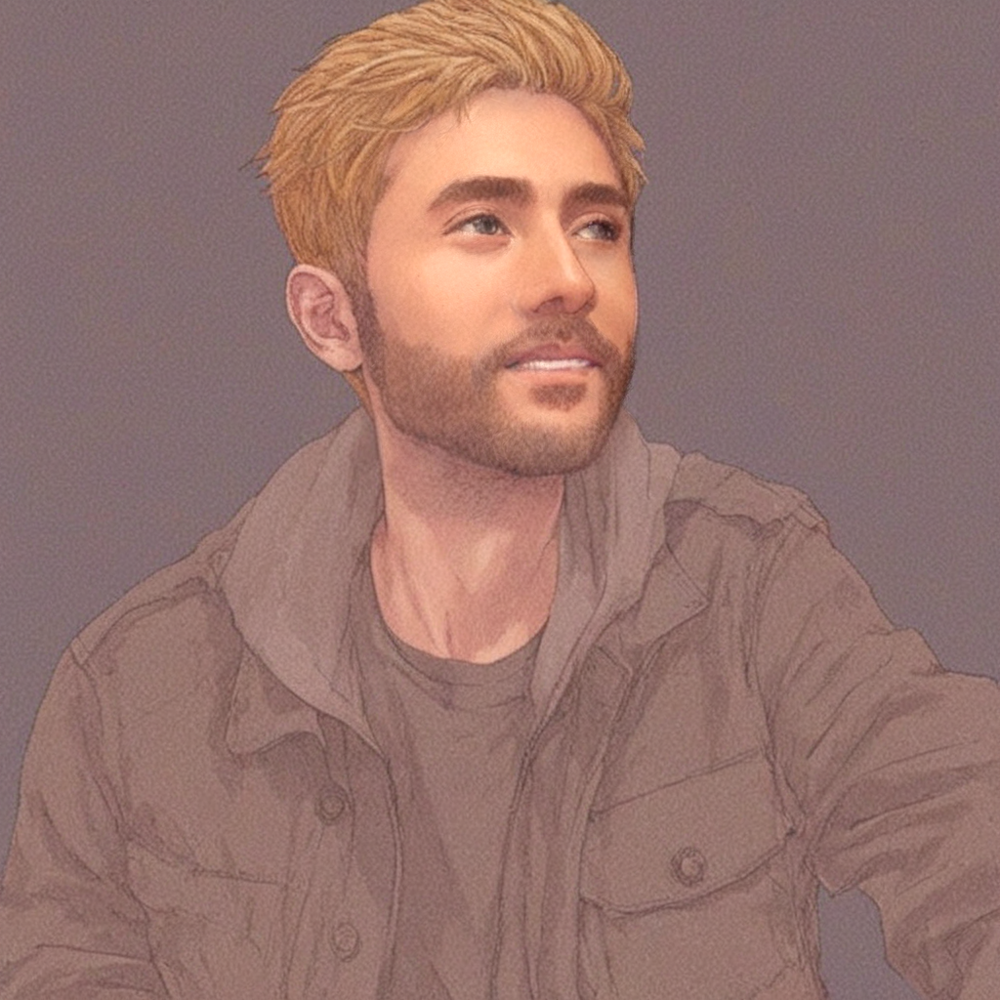


🖼️  Generating image...
   Mode    : 🎨 ControlNet Style Transfer
   Prompt  : oil painting masterpiece
   Style   : painting
   Seed    : 2265292783
   Input   : /kaggle/input/datasets/mdfaisalahmedrudro/testdatasetimages/TEST2.jpg
   CN scale: 0.5

🤖 STAGE 1: LOADING LLM FOR PROMPT REFINEMENT
   Model : mistralai/Mistral-7B-Instruct-v0.2
   Quant : 4-bit NF4



Loading checkpoint shards:   0%|          | 0/3 [00:00<?, ?it/s]

✅ LLM ready!

🔄 Refining [painting]: 'oil painting masterpiece'
✅ Refined : 'masterpiece, best quality, highly detailed, oil painting style, classical art, intricately textured brushstrokes, rich colors, lifelike depiction, museum quality, grandeur and elegance, old world charm, evoking a sense of timeless beauty and sophistication.'

🗑️  LLM freed from VRAM

   Mode        : 🎨 Dual ControlNet + Face Preserve
   Style       : painting  (trigger: paintingstyle)
   Steps       : 30  |  CFG: 7.5
   Prompt      : paintingstyle, masterpiece, best quality, highly detailed, oil painting style, classical a...
   Input image  : /kaggle/input/datasets/mdfaisalahmedrudro/testdatasetimages/TEST2.jpg
   Original size: 1781×2048
   Resized to   : 1024×1024
   ✅ Canny map generated
   ✅ Depth map generated
   CN scales   : canny=0.5  depth=0.6


  0%|          | 0/30 [00:00<?, ?it/s]

   ✅ Face paste-back complete
   ✅ Done in 49.8s

   💾 Saved : /kaggle/working/generated_images/painting_controlnet_2265292783_001.png
✅ Saved : ['/kaggle/working/generated_images/painting_controlnet_2265292783_001.png']



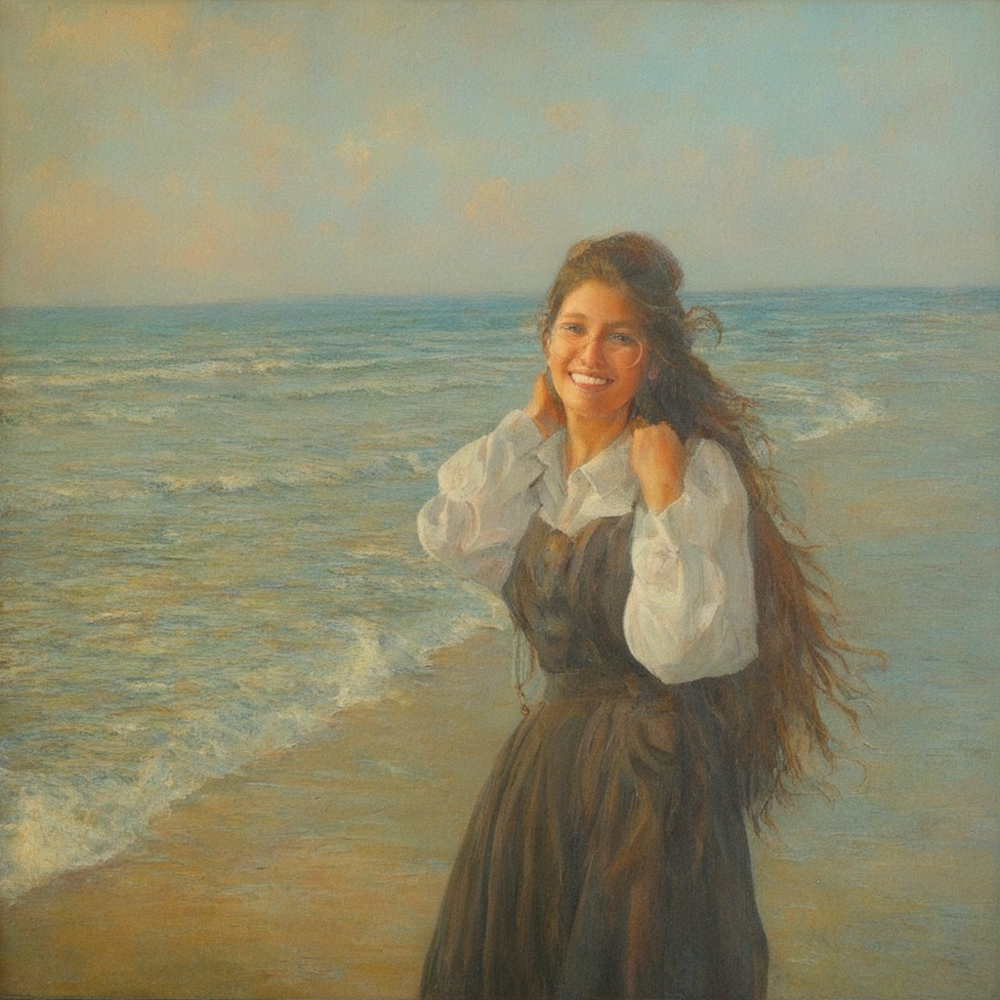


🖼️  Generating image...
   Mode    : 🎨 ControlNet Style Transfer
   Prompt  : pencil sketch portrait
   Style   : sketch
   Seed    : 3451335813
   Input   : /kaggle/input/datasets/mdfaisalahmedrudro/testdatasetimages/TEST3.jpg
   CN scale: 0.7

🤖 STAGE 1: LOADING LLM FOR PROMPT REFINEMENT
   Model : mistralai/Mistral-7B-Instruct-v0.2
   Quant : 4-bit NF4



Loading checkpoint shards:   0%|          | 0/3 [00:00<?, ?it/s]

✅ LLM ready!

🔄 Refining [sketch]: 'pencil sketch portrait'
✅ Refined : 'masterpiece, best quality, highly detailed, pencil sketch portrait, intricately shaded and textured, lifelike facial features, realistic wrinkles and pores, expressive hands and clothing folds, subtle highlights and shadows, clean and smooth edges.'

🗑️  LLM freed from VRAM

   Mode        : 🎨 Dual ControlNet + Face Preserve
   Style       : sketch  (trigger: sketchstyle)
   Steps       : 30  |  CFG: 7.5
   Prompt      : sketchstyle, masterpiece, best quality, highly detailed, pencil sketch portrait, intricate...
   Input image  : /kaggle/input/datasets/mdfaisalahmedrudro/testdatasetimages/TEST3.jpg
   Original size: 1463×2048
   Resized to   : 1024×1024
   ✅ Canny map generated
   ✅ Depth map generated
   CN scales   : canny=0.7  depth=0.7999999999999999


  0%|          | 0/30 [00:00<?, ?it/s]

   ✅ Face paste-back complete
   ✅ Done in 49.7s

   💾 Saved : /kaggle/working/generated_images/sketch_controlnet_3451335813_001.png
✅ Saved : ['/kaggle/working/generated_images/sketch_controlnet_3451335813_001.png']



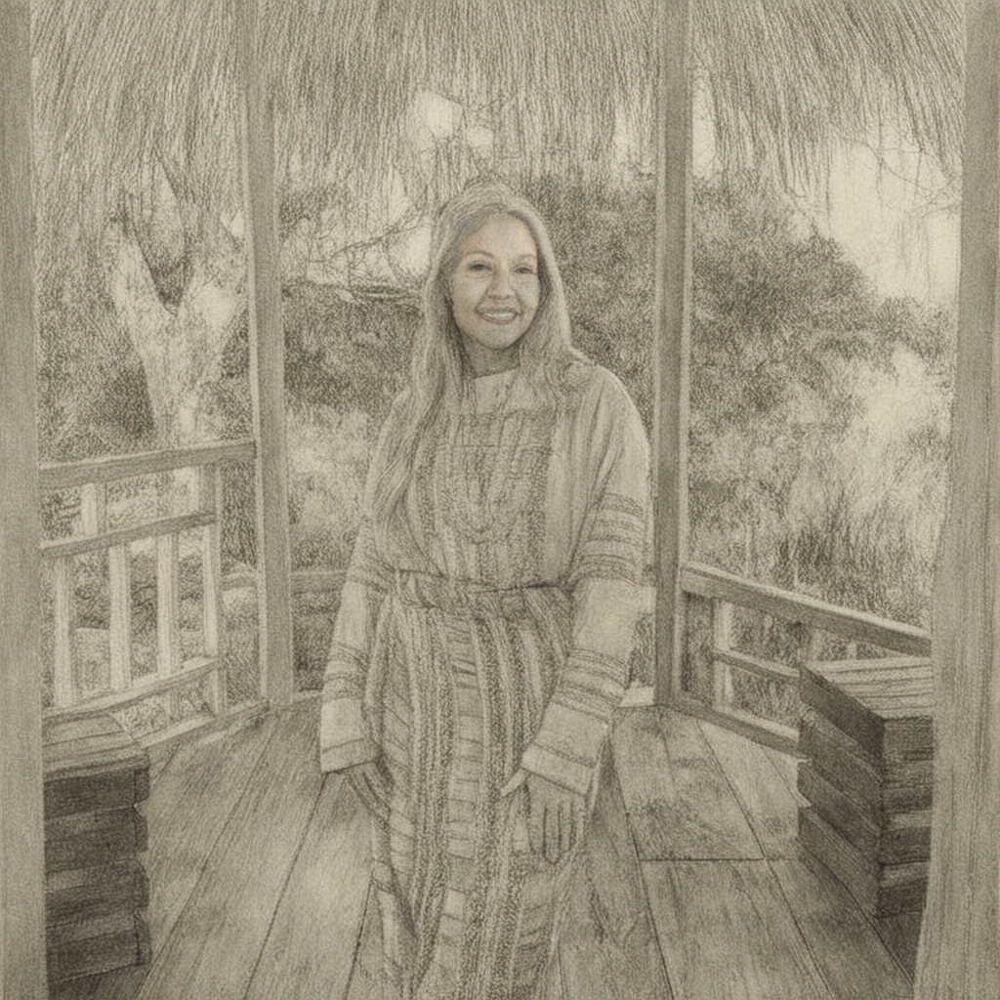


🖼️  Generating image...
   Mode    : 🎨 ControlNet Style Transfer
   Prompt  : convert to portrait
   Style   : portrait
   Seed    : 4287197562
   Input   : /kaggle/input/datasets/mdfaisalahmedrudro/testdatasetimages/TEST.jpg
   CN scale: style-aware default

🤖 STAGE 1: LOADING LLM FOR PROMPT REFINEMENT
   Model : mistralai/Mistral-7B-Instruct-v0.2
   Quant : 4-bit NF4



Loading checkpoint shards:   0%|          | 0/3 [00:00<?, ?it/s]

✅ LLM ready!

🔄 Refining [portrait]: 'convert to portrait'
✅ Refined : 'masterpiece, best quality, highly detailed, realistic portrait photography, high definition, professional lighting, close-up headshot, sharp focus on subject's face, intricately textured skin, deep, soulful eyes, skillfully rendered shadows and highlights.'

🗑️  LLM freed from VRAM

   Mode        : 🎨 Dual ControlNet + Face Preserve
   Style       : portrait  (trigger: portraitstyle)
   Steps       : 30  |  CFG: 7.5
   Prompt      : portraitstyle, masterpiece, best quality, highly detailed, realistic portrait photography,...
   Input image  : /kaggle/input/datasets/mdfaisalahmedrudro/testdatasetimages/TEST.jpg
   Original size: 1542×2048
   Resized to   : 1024×1024
   ✅ Canny map generated
   ✅ Depth map generated
   CN scales   : canny=0.3  depth=0.5


  0%|          | 0/30 [00:00<?, ?it/s]

   ✅ Face paste-back complete
   ✅ Done in 49.8s

   💾 Saved : /kaggle/working/generated_images/portrait_controlnet_4287197562_001.png
✅ Saved : ['/kaggle/working/generated_images/portrait_controlnet_4287197562_001.png']



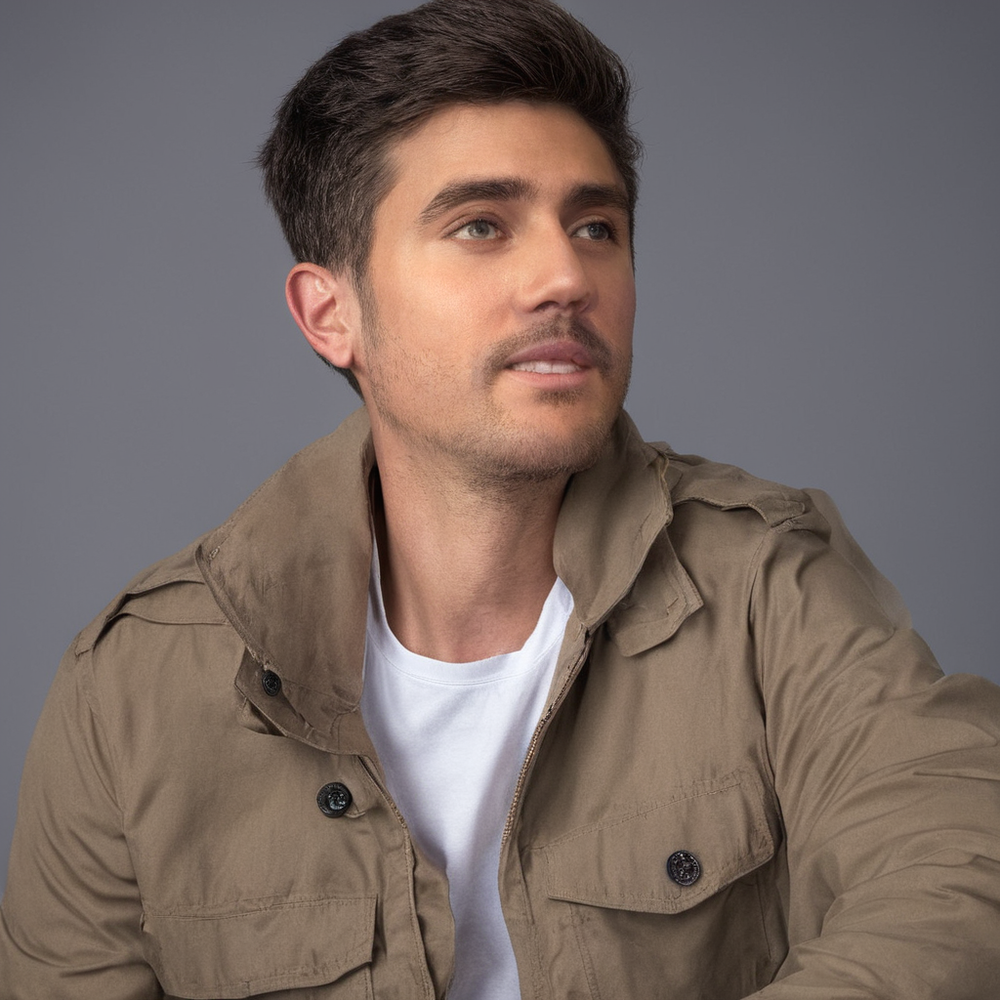


🖼️  Generating image...
   Mode    : 🎨 ControlNet Style Transfer
   Prompt  : wikiart please
   Style   : wikiart
   Seed    : 94879371
   Input   : /kaggle/input/datasets/mdfaisalahmedrudro/testdatasetimages/TEST2.jpg
   CN scale: 0.5

🤖 STAGE 1: LOADING LLM FOR PROMPT REFINEMENT
   Model : mistralai/Mistral-7B-Instruct-v0.2
   Quant : 4-bit NF4



Loading checkpoint shards:   0%|          | 0/3 [00:00<?, ?it/s]

✅ LLM ready!

🔄 Refining [wikiart]: 'wikiart please'
✅ Refined : 'masterpiece, best quality, highly detailed, fine art in a specific art movement style, expressive, museum quality, a captivating scene inspired by WikiArt, intricately painted with rich colors and textures, expressing the essence of the art movement, every brushstroke meticulously placed to convey depth and meaning.'

🗑️  LLM freed from VRAM

   Mode        : 🎨 Dual ControlNet + Face Preserve
   Style       : wikiart  (trigger: wikiartStyle)
   Steps       : 30  |  CFG: 7.5
   Prompt      : wikiartStyle, masterpiece, best quality, highly detailed, fine art in a specific art movem...
   Input image  : /kaggle/input/datasets/mdfaisalahmedrudro/testdatasetimages/TEST2.jpg
   Original size: 1781×2048
   Resized to   : 1024×1024
   ✅ Canny map generated
   ✅ Depth map generated
   CN scales   : canny=0.5  depth=0.6


  0%|          | 0/30 [00:00<?, ?it/s]

   ✅ Face paste-back complete
   ✅ Done in 49.5s

   💾 Saved : /kaggle/working/generated_images/wikiart_controlnet_94879371_001.png
✅ Saved : ['/kaggle/working/generated_images/wikiart_controlnet_94879371_001.png']



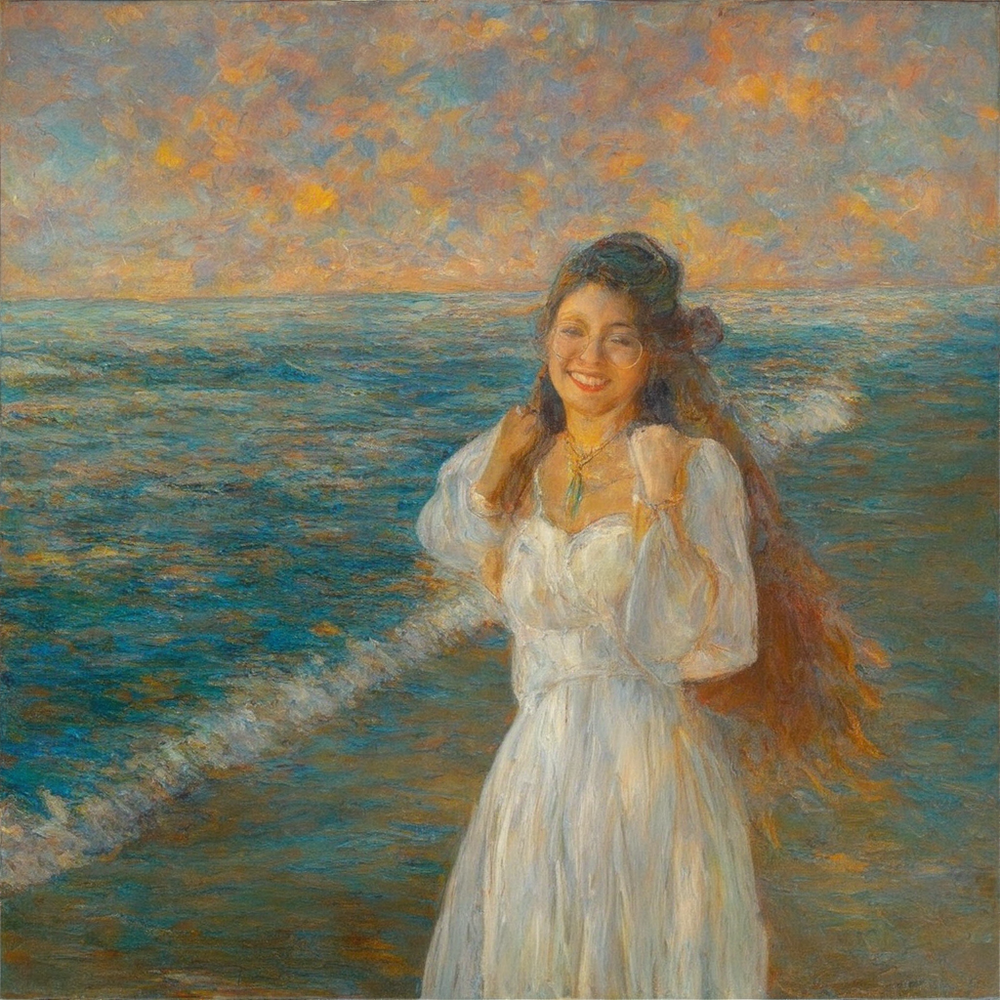


🖼️  Generating image...
   Mode    : 🎨 ControlNet Style Transfer
   Prompt  : pencil sketch portrait
   Style   : sketch
   Seed    : 4271293644
   Input   : /kaggle/input/datasets/mdfaisalahmedrudro/testdatasetimages/TEST.jpg
   CN scale: 0.7

🤖 STAGE 1: LOADING LLM FOR PROMPT REFINEMENT
   Model : mistralai/Mistral-7B-Instruct-v0.2
   Quant : 4-bit NF4



Loading checkpoint shards:   0%|          | 0/3 [00:00<?, ?it/s]

✅ LLM ready!

🔄 Refining [sketch]: 'pencil sketch portrait'
✅ Refined : 'masterpiece, best quality, highly detailed, pencil sketch portrait, intricately textured skin and clothing, expressive facial features, subtle shading and highlights, clean lines and precise details, blank canvas as background.'

🗑️  LLM freed from VRAM

   Mode        : 🎨 Dual ControlNet + Face Preserve
   Style       : sketch  (trigger: sketchstyle)
   Steps       : 30  |  CFG: 7.5
   Prompt      : sketchstyle, masterpiece, best quality, highly detailed, pencil sketch portrait, intricate...
   Input image  : /kaggle/input/datasets/mdfaisalahmedrudro/testdatasetimages/TEST.jpg
   Original size: 1542×2048
   Resized to   : 1024×1024
   ✅ Canny map generated
   ✅ Depth map generated
   CN scales   : canny=0.7  depth=0.7999999999999999


  0%|          | 0/30 [00:00<?, ?it/s]

   ✅ Face paste-back complete
   ✅ Done in 49.8s

   💾 Saved : /kaggle/working/generated_images/sketch_controlnet_4271293644_001.png
✅ Saved : ['/kaggle/working/generated_images/sketch_controlnet_4271293644_001.png']



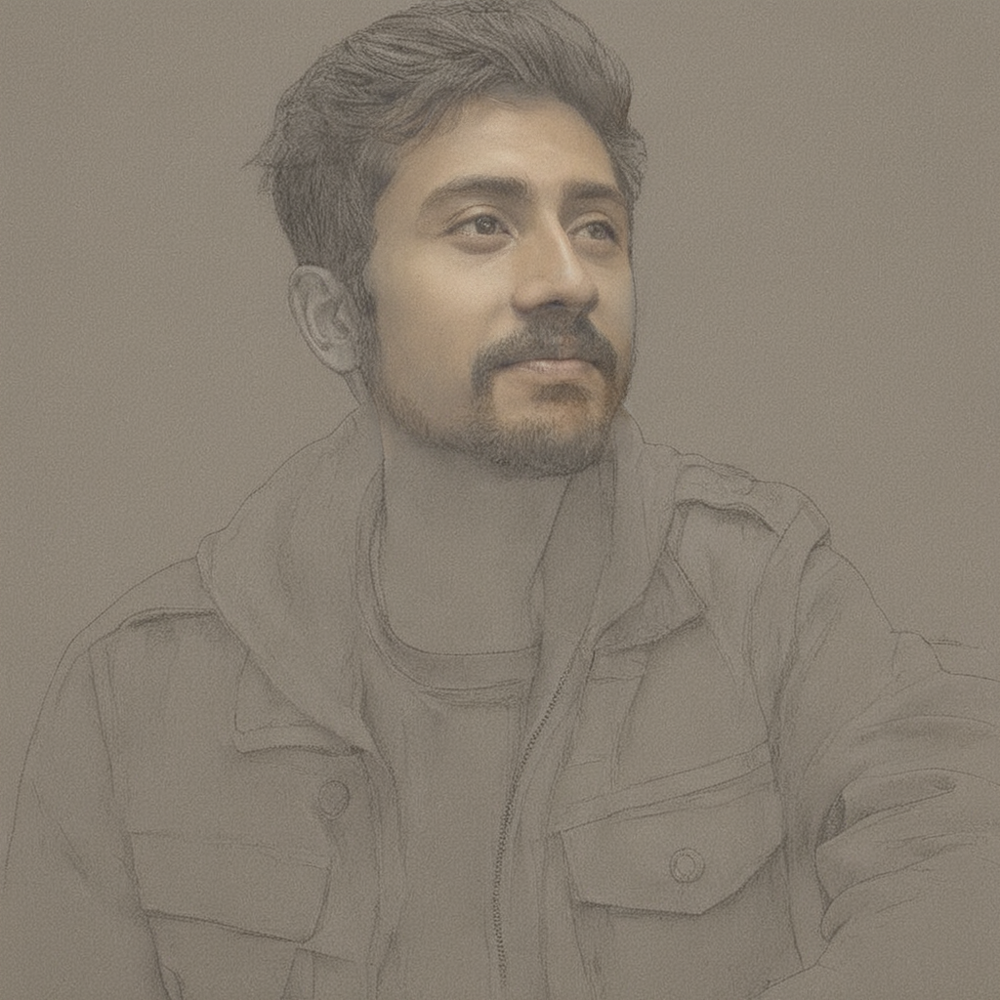

{'images': [<PIL.Image.Image image mode=RGB size=1024x1024>],
 'paths': ['/kaggle/working/generated_images/sketch_controlnet_4271293644_001.png'],
 'refined_prompt': 'masterpiece, best quality, highly detailed, pencil sketch portrait, intricately textured skin and clothing, expressive facial features, subtle shading and highlights, clean lines and precise details, blank canvas as background.',
 'style': 'sketch',
 'mode': 'controlnet',
 'seed': 4271293644}

In [3]:
    generate("convert to anime",
        style="anime",
        image_path="/kaggle/input/datasets/mdfaisalahmedrudro/testdatasetimages/TEST.jpg")
    #
    generate("oil painting masterpiece",
        style="painting",
        image_path="/kaggle/input/datasets/mdfaisalahmedrudro/testdatasetimages/TEST2.jpg",
        controlnet_scale=0.5)   # 0.5 = বেশি style freedom
    #
    generate("pencil sketch portrait",
        style="sketch",
        image_path="/kaggle/input/datasets/mdfaisalahmedrudro/testdatasetimages/TEST3.jpg",
        controlnet_scale=0.7)   # 0.7 = face structure বেশি ধরবে
    generate("convert to portrait",
        style="portrait",
        image_path="/kaggle/input/datasets/mdfaisalahmedrudro/testdatasetimages/TEST.jpg")
    #
    generate("wikiart please",
        style="wikiart",
        image_path="/kaggle/input/datasets/mdfaisalahmedrudro/testdatasetimages/TEST2.jpg",
        controlnet_scale=0.5)   # 0.5 = বেশি style freedom
    #
    generate("pencil sketch portrait",
        style="sketch",
        image_path="/kaggle/input/datasets/mdfaisalahmedrudro/testdatasetimages/TEST.jpg",
        controlnet_scale=0.7)   # 0.7 = face structure বেশি ধরবে